In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import uuid
from math import ceil
import os

from utils import *

In [2]:
class Config:
    img_name = '25-Uma_imagem_com_livre_escolha_do_grupo-20221010_080953.jpg'
    path_img_crua = f'img/crua/{img_name}'
    path_img_recortada = f'img/recortada/{img_name}'
CONFIG = Config()
print(os.getcwd() + "\\" + CONFIG.path_img_crua.replace('/', '\\'))

j:\Meu Drive\_1_EC\_PDI\notebooks\prova1\img\crua\25-Uma_imagem_com_livre_escolha_do_grupo-20221010_080953.jpg


### Obtendo a imagem crua

(3060, 4080, 3)

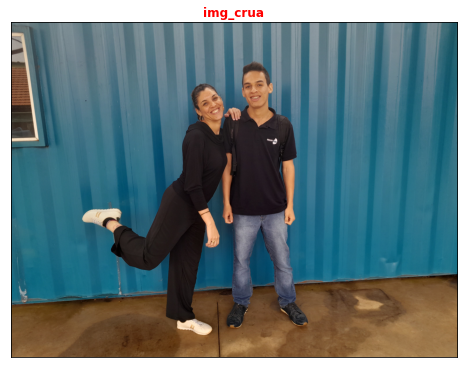

In [3]:
img_crua = cv2.imread(CONFIG.path_img_crua)
show_img(img_crua, 'img_crua')
img_crua.shape

### Fazendo e salvando o recorte da imagem

True

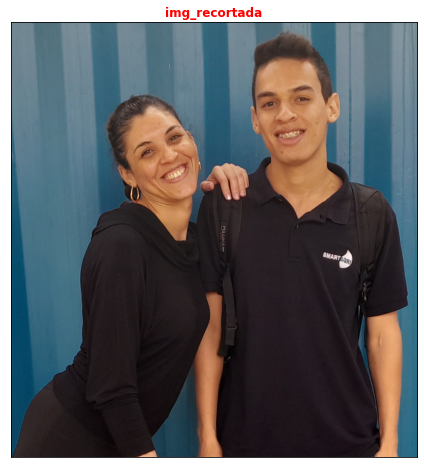

In [4]:
img_recortada = img_crua[330:1720, 1340:2640]
show_img(img_recortada, 'img_recortada')
cv2.imwrite(CONFIG.path_img_recortada, img_recortada)

### Carregando o recorte da imagem

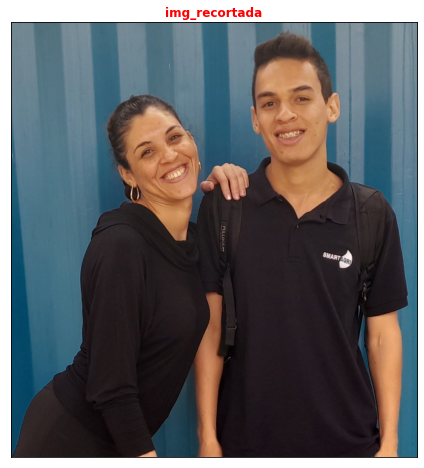

In [5]:
img_recortada = cv2.imread(CONFIG.path_img_recortada)
show_img(img_recortada, 'img_recortada')

## Relacionamento entre pixels

### RGB

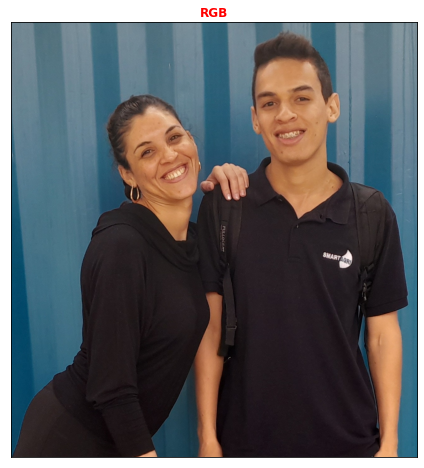

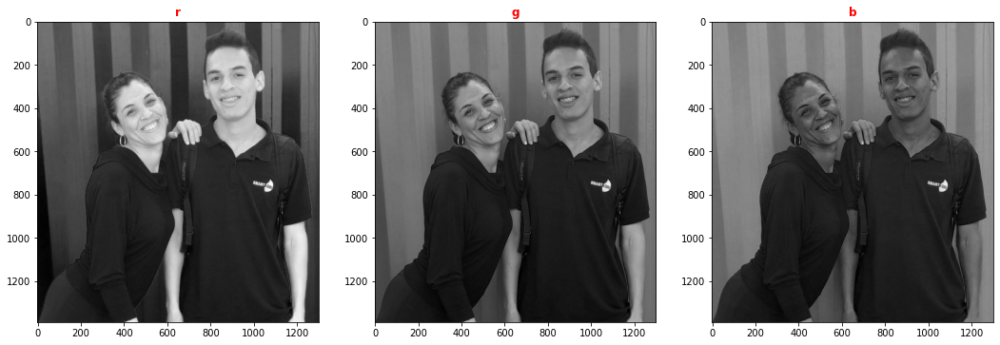

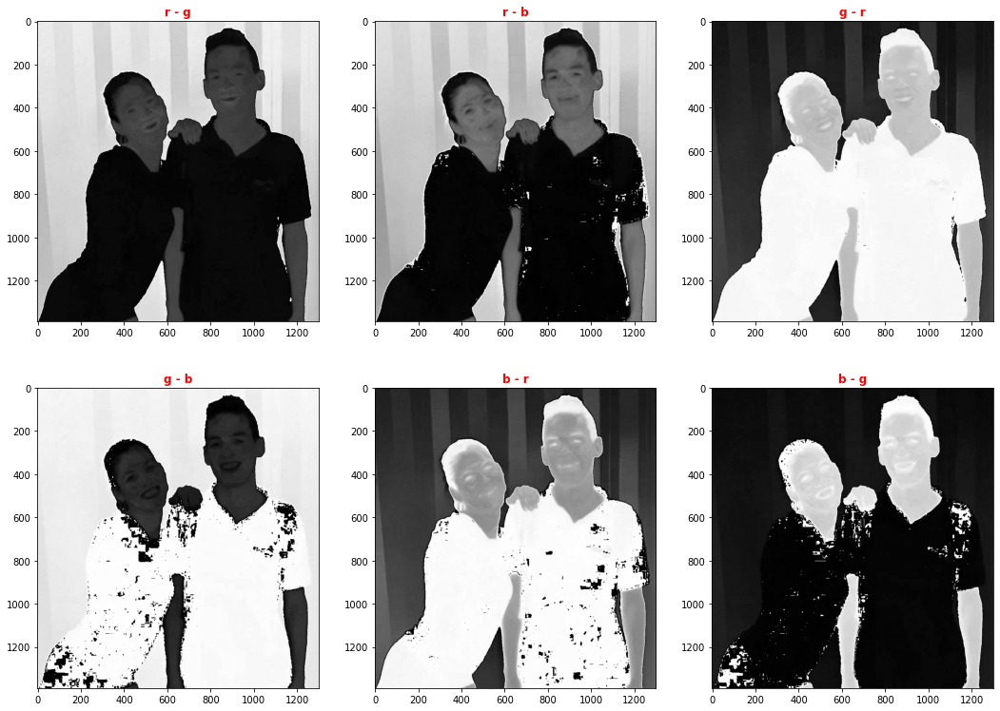

In [6]:
img = img_recortada

# converto em cada canal
b = img[:, :, 0]
g = img[:, :, 1]
r = img[:, :, 2]

show_img(img, 'RGB')

img_data = {
    "r": r,
    "g": g,
    "b": b,
}
show_img_grid(img_data)

img_data = {
    "r - g": r - g,
    "r - b": r - b,
    "g - r": g - r,
    "g - b": g - b,
    "b - r": b - r,
    "b - g": b - g,
}
show_img_grid(img_data)

### HSV

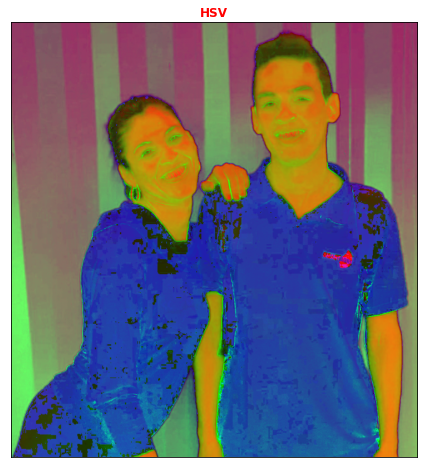

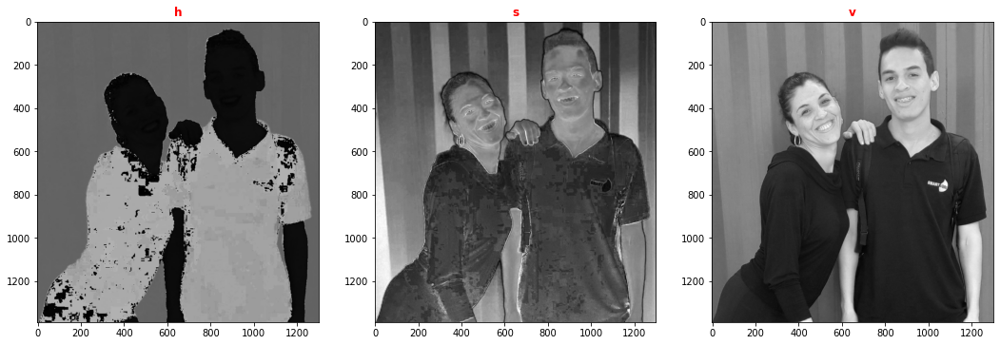

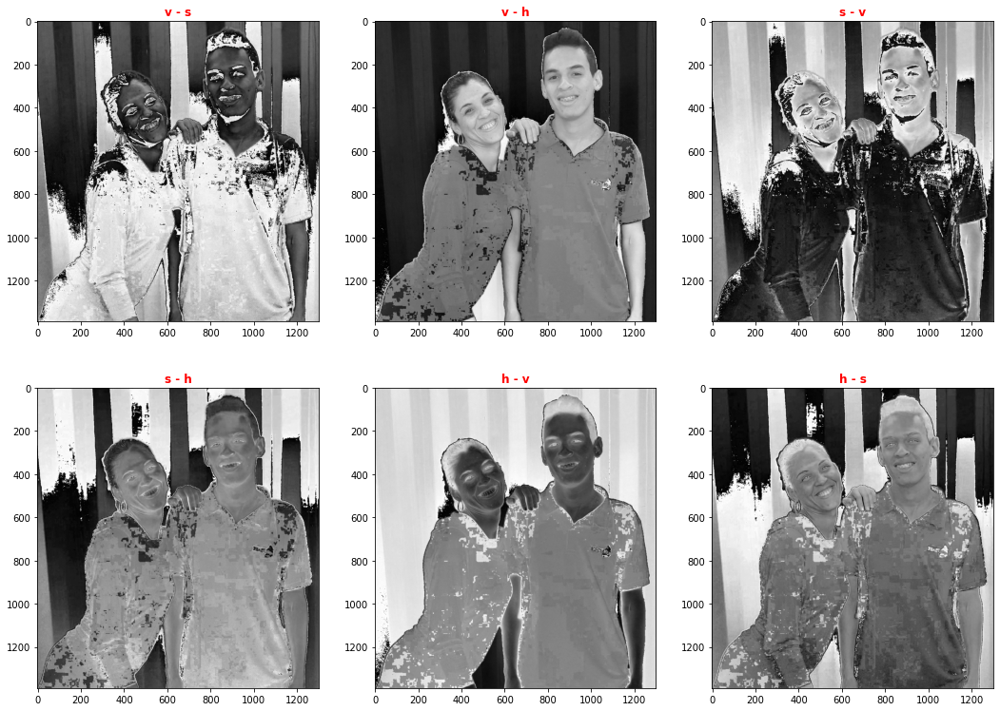

In [7]:
img = cv2.cvtColor(img_recortada, cv2.COLOR_BGR2HSV)

# converto em cada canal
h = img[:, :, 0]
s = img[:, :, 1]
v = img[:, :, 2]

show_img(img, 'HSV')

img_data = {
    "h": h,
    "s": s,
    "v": v,
}
show_img_grid(img_data)

img_data = {
    "v - s": v - s,
    "v - h": v - h,
    "s - v": s - v,
    "s - h": s - h,
    "h - v": h - v,
    "h - s": h - s,
}
show_img_grid(img_data)

### LAB

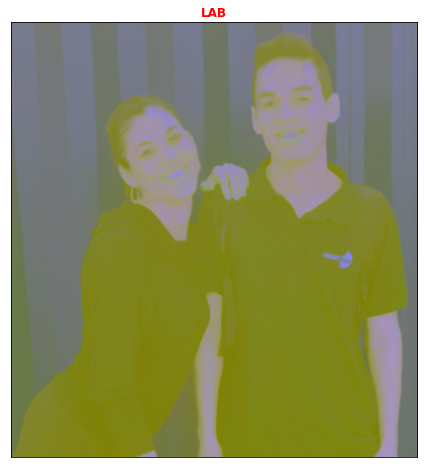

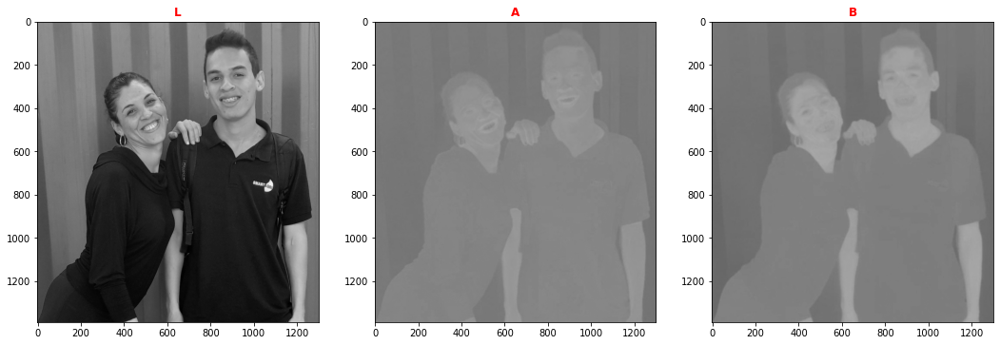

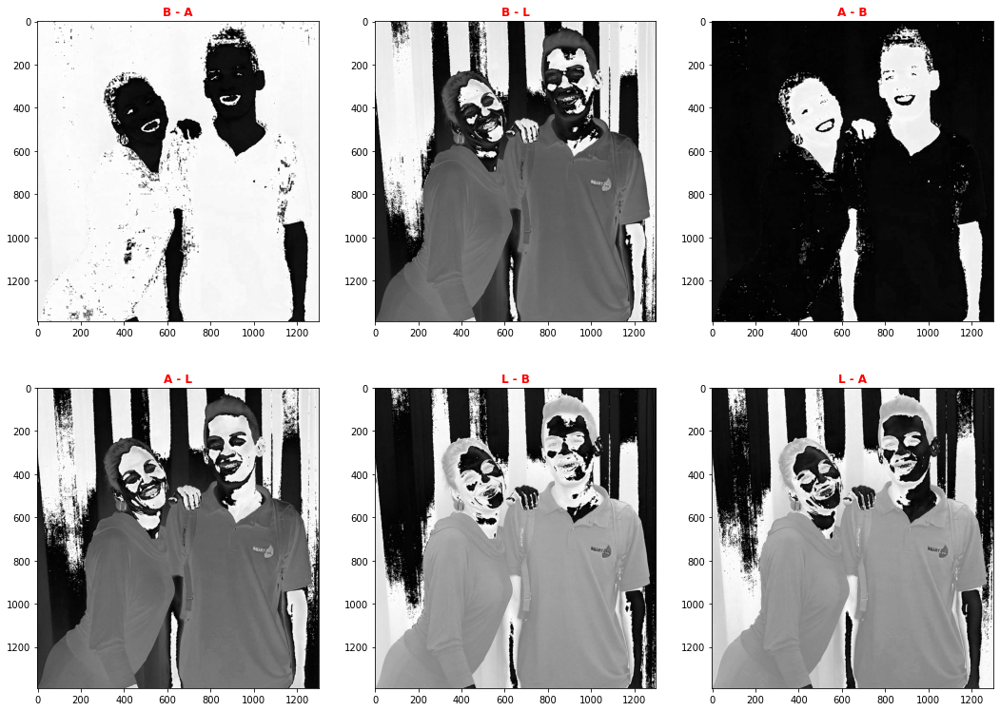

In [8]:
img = cv2.cvtColor(img_recortada, cv2.COLOR_BGR2LAB)

# converto em cada canal
L = img[:, :, 0]
A = img[:, :, 1]
B = img[:, :, 2]

show_img(img, 'LAB')

img_data = {
    "L": L,
    "A": A,
    "B": B,
}
show_img_grid(img_data)

img_data = {
    "B - A": B - A,
    "B - L": B - L,
    "A - B": A - B,
    "A - L": A - L,
    "L - B": L - B,
    "L - A": L - A,
}
show_img_grid(img_data)

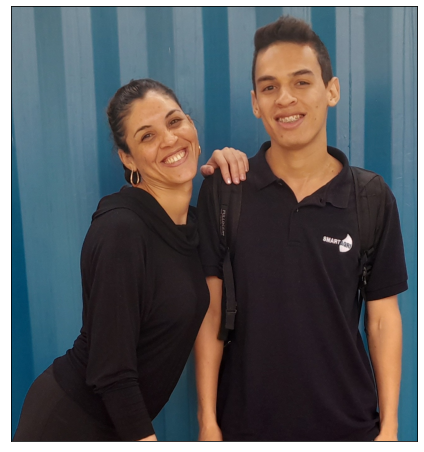

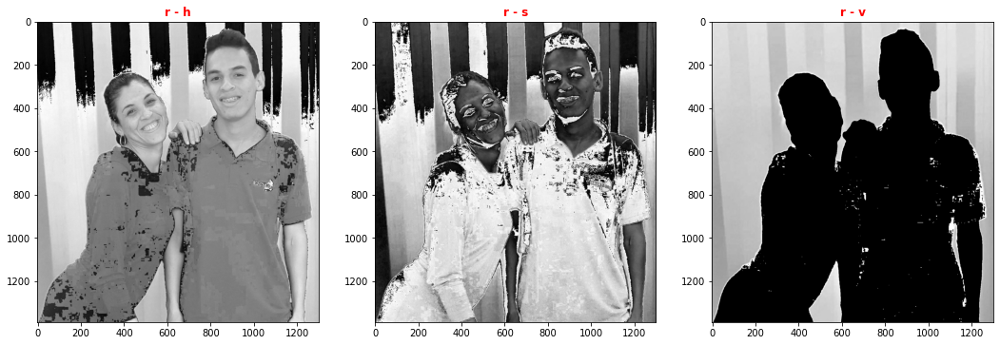

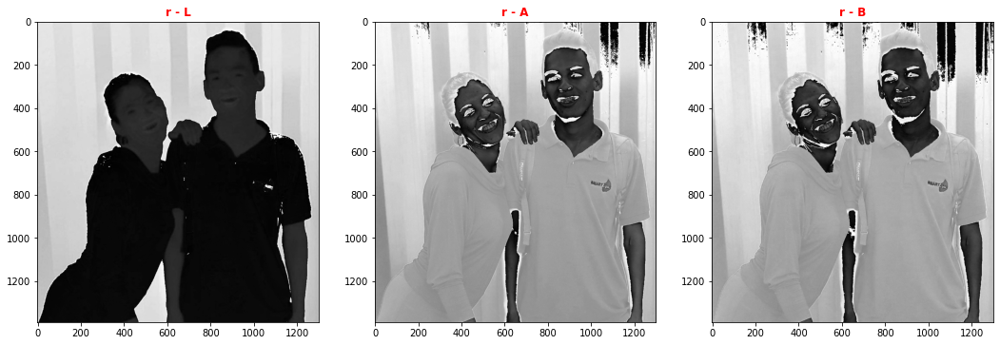

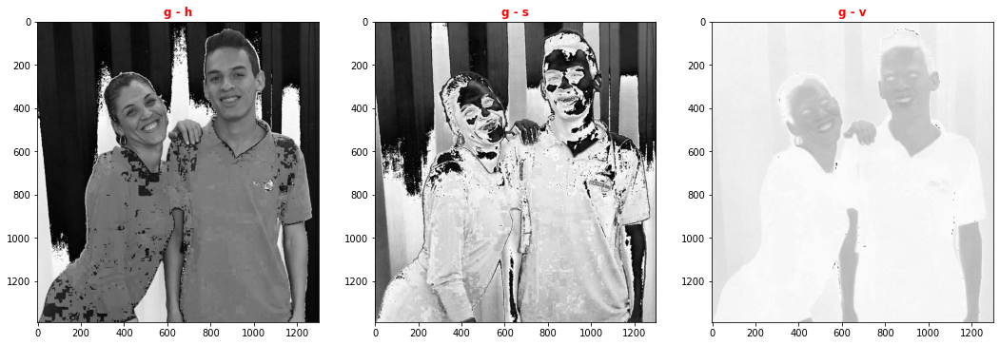

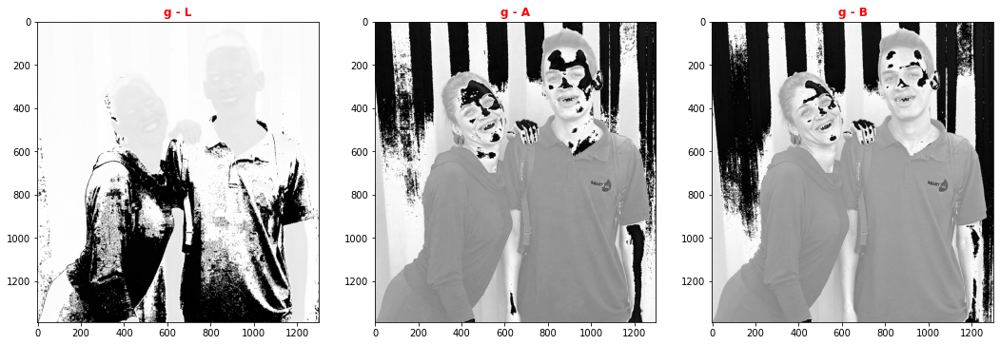

...

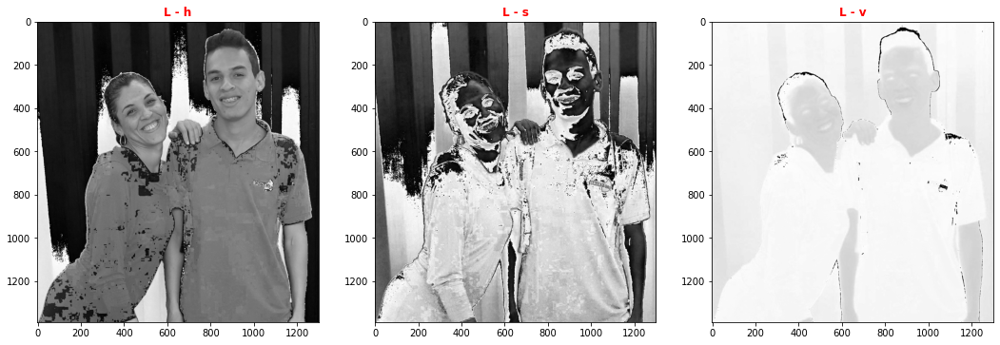

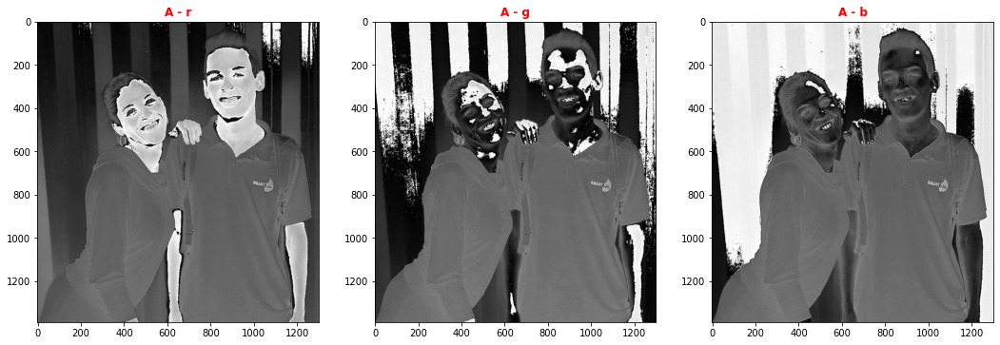

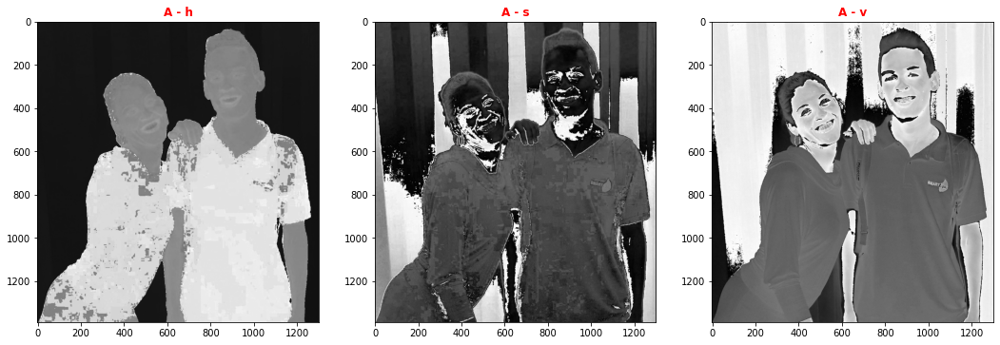

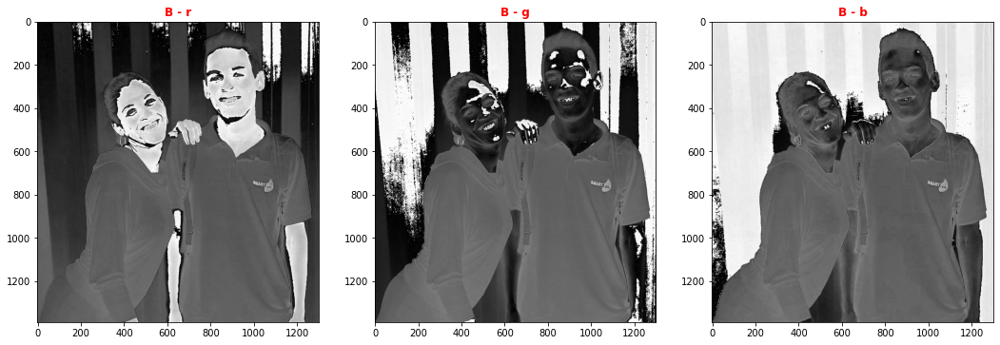

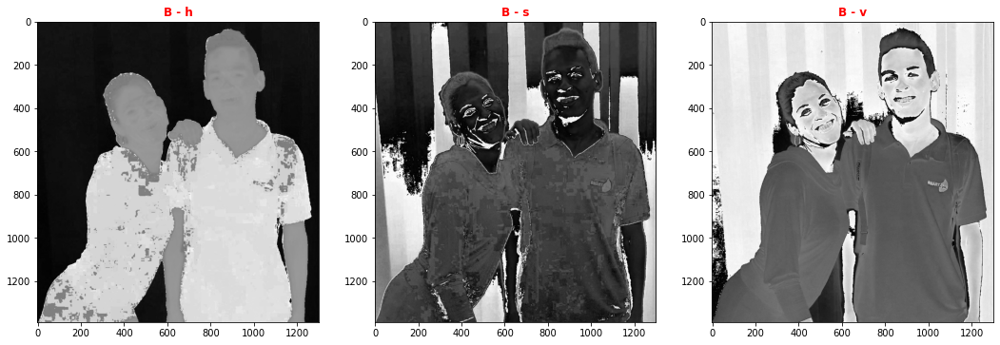

In [9]:
img = img_recortada
show_img(img)

img_data = {
    "r - h": r - h, "r - s": r - s, "r - v": r - v, "r - L": r - L, "r - A": r - A, "r - B": r - B, "g - h": g - h, "g - s": g - s, "g - v": g - v, "g - L": g - L, "g - A": g - A, "g - B": g - B, "b - h": b - h, "b - s": b - s, "b - v": b - v, "b - L": b - L, "b - A": b - A, "b - B": b - B, "h - r": h - r, "h - g": h - g, "h - b": h - b, "h - L": h - L, "h - A": h - A, "h - B": h - B, "s - r": s - r, "s - g": s - g, "s - b": s - b, "s - L": s - L, "s - A": s - A, "s - B": s - B, "v - r": v - r, "v - g": v - g, "v - b": v - b, "v - L": v - L, "v - A": v - A, "v - B": v - B, "L - r": L - r, "L - g": L - g, "L - b": L - b, "L - h": L - h, "L - s": L - s, "L - v": L - v, "A - r": A - r, "A - g": A - g, "A - b": A - b, "A - h": A - h, "A - s": A - s, "A - v": A - v, "B - r": B - r, "B - g": B - g, "B - b": B - b, "B - h": B - h, "B - s": B - s, "B - v": B - v,
}
img_data = list(img_data.items())
for i in range(0, len(img_data), 3):
    show_img_grid({
        img_data[i + 0][0]: img_data[i + 0][1],
        img_data[i + 1][0]: img_data[i + 1][1],
        img_data[i + 2][0]: img_data[i + 2][1],
    }, ncols=3)

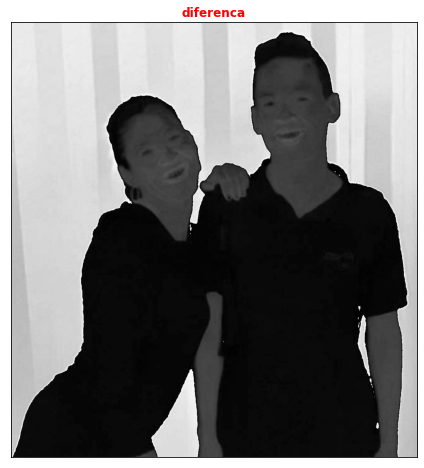

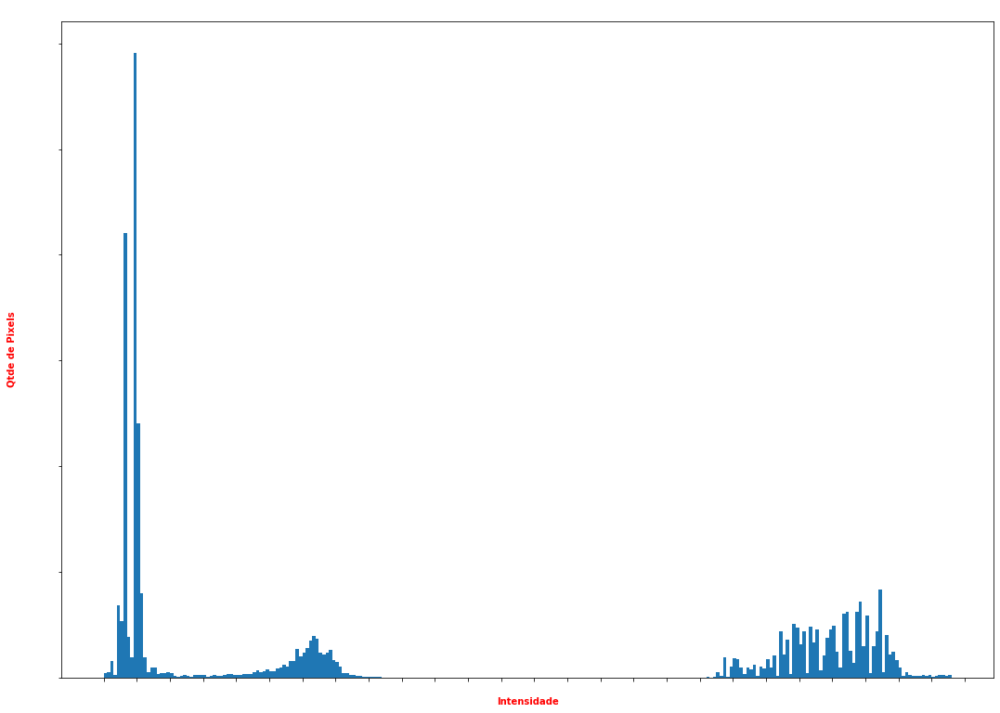

In [18]:
diferenca = r - g
show_img(diferenca, 'diferenca')
show_hist(diferenca, 'diferenca')

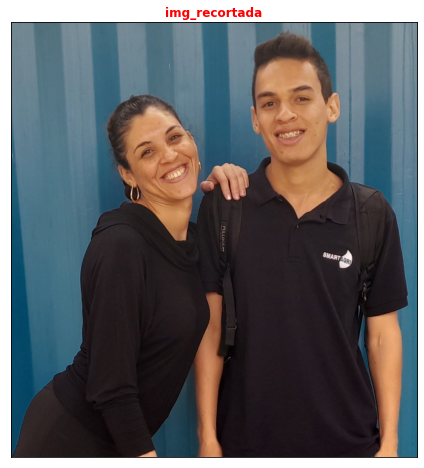

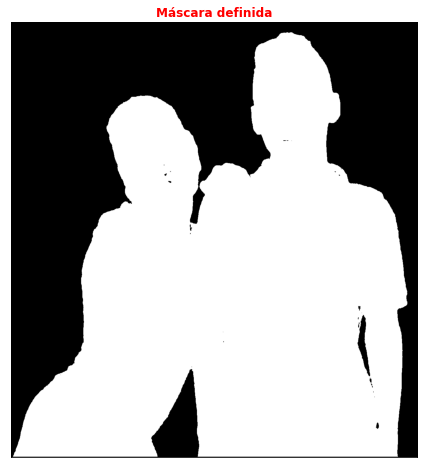

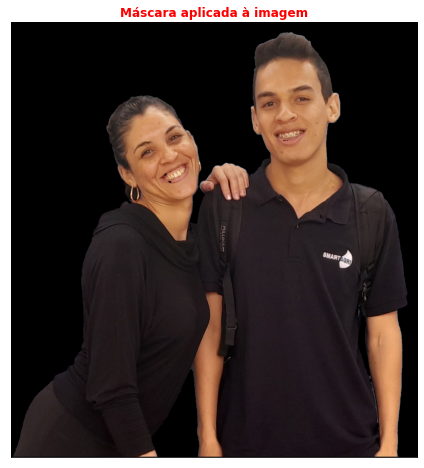

In [20]:
mascara = np.zeros(img_recortada.shape[:2], dtype = "uint8")

# DIFERENÇA:
v = [i for i in range(0, 85, 1)]
for x in range(1, diferenca.shape[0]-1,1):
    for y in range(1,diferenca.shape[1]-1,1):
        if (diferenca[x,y] in v):
            if ((diferenca[x-1,y-1] in v) or
                (diferenca[x-1,y] in v) or
                (diferenca[x-1,y+1] in v) or
                (diferenca[x,y-1] in v) or
                (diferenca[x,y+1] in v) or
                (diferenca[x+1,y-1] in v) or
                (diferenca[x+1,y] in v)or
                (diferenca[x+1,y+1] in v)):
                mascara[x,y] = 255

show_img(img_recortada, 'img_recortada')
           
# mostra a máscara
show_img(mascara, "Máscara definida")

# aplica a máscara a imagem
# faz uma operação and da imagem com a imagem de acordo a máscara
img_com_mascara = cv2.bitwise_and(img_recortada, img_recortada, mask = mascara)

# mostra a imagem após aplicar a máscar
show_img(img_com_mascara, "Máscara aplicada à imagem")


## histogramas

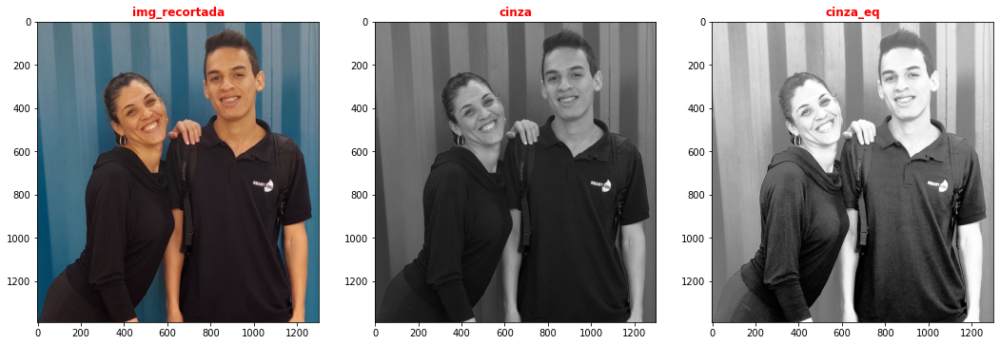

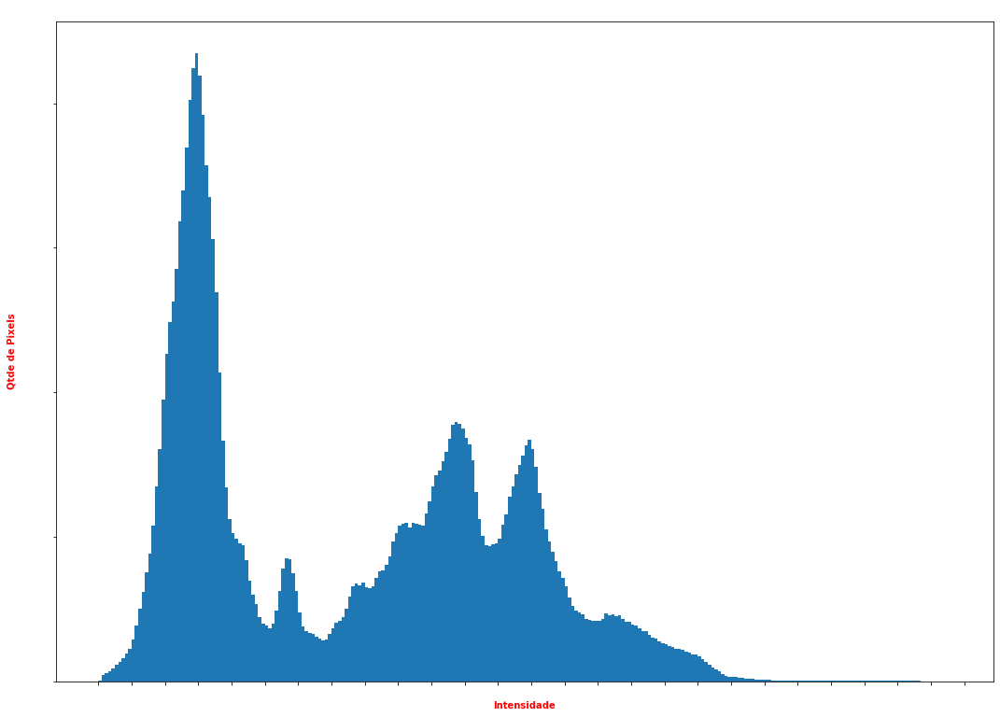

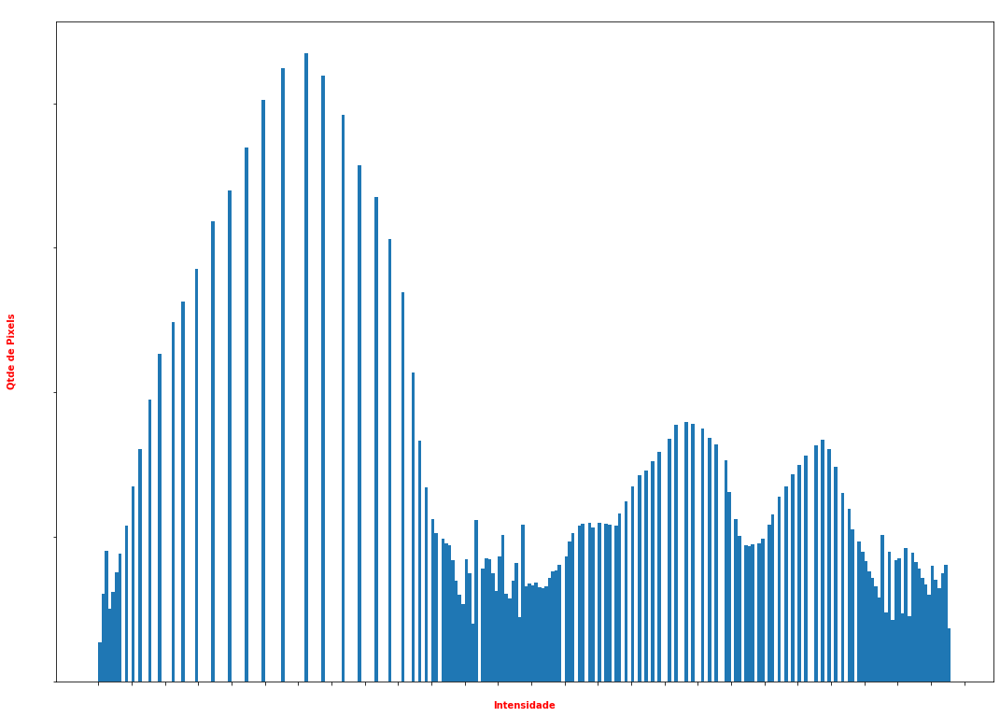

In [13]:
# converte a imagem em nível de cinza
cinza = cv2.cvtColor(img_recortada, cv2.COLOR_BGR2GRAY)

# # realiza a equalização da imagem
cinza_eq = cv2.equalizeHist(cinza)

img_data = {
    "img_recortada": img_recortada,
    "cinza": cinza,
    "cinza_eq": cinza_eq,
}
show_img_grid(img_data, ncols=3)

show_hist(cinza, "Histograma")
show_hist(cinza_eq, "Histograma equalizado")


## Binarização de imagens 

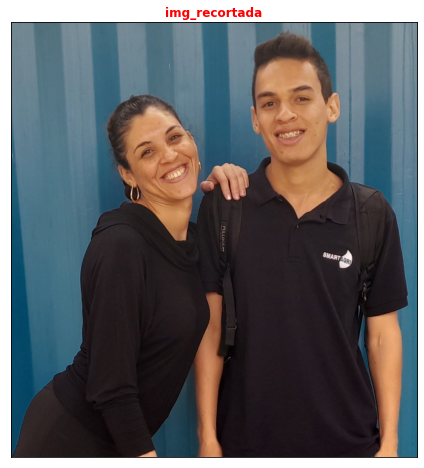

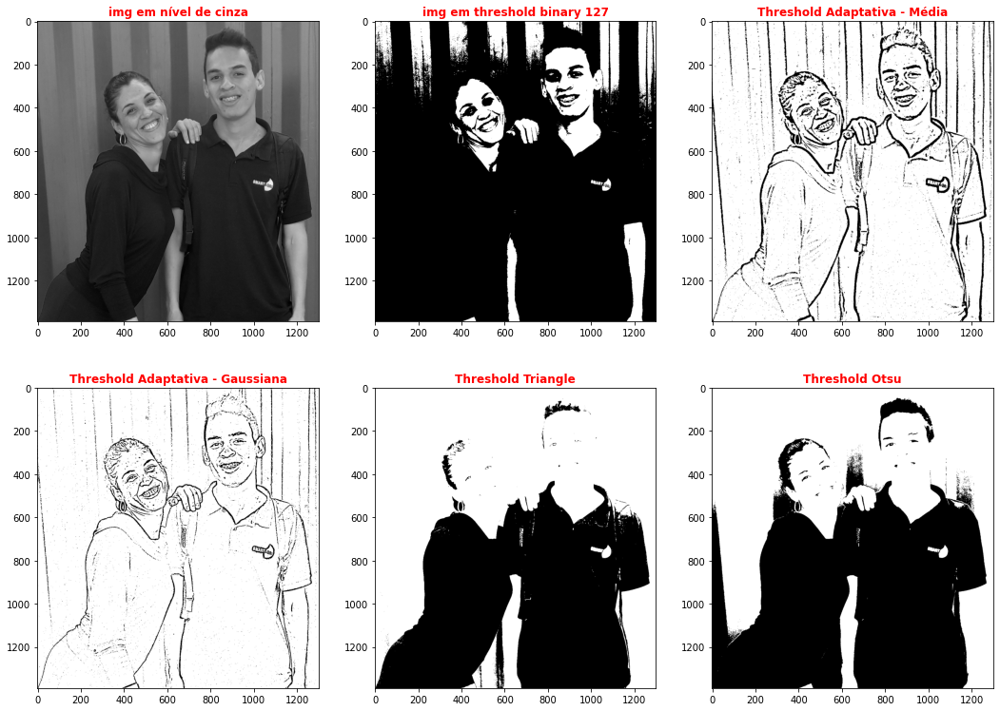

In [14]:
# converte a imagem em nível de cinza
cinza = cv2.cvtColor(img_recortada, cv2.COLOR_BGR2GRAY)

# ret é o valor limiar (threshold) que neste caso será 127
ret, thresh_binary = cv2.threshold(cinza, 127, 255, cv2.THRESH_BINARY)

# adaptative threshold - Média
thresh_adaptative_media = cv2.adaptiveThreshold(
    cinza, 255, 
    cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 
    21, 5
)

# adaptative threshold - Gaussiana
thresh_adaptative_gaussiana = cv2.adaptiveThreshold(
    cinza, 255, 
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 
    21, 5
)

# triangle threshold
ret3, thresh_triangle = cv2.threshold(cinza, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)

# Otsu threshold
ret4, thresh_otsu = cv2.threshold (cinza, 0,255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

show_img(img_recortada, "img_recortada")

img_data = {
    "img em nível de cinza": cinza,
    "img em threshold binary 127": thresh_binary,
    "Threshold Adaptativa - Média": thresh_adaptative_media,
    "Threshold Adaptativa - Gaussiana": thresh_adaptative_gaussiana,
    "Threshold Triangle": thresh_triangle,
    "Threshold Otsu": thresh_otsu,
}
show_img_grid(img_data, ncols=3)

### Cinza equalizado

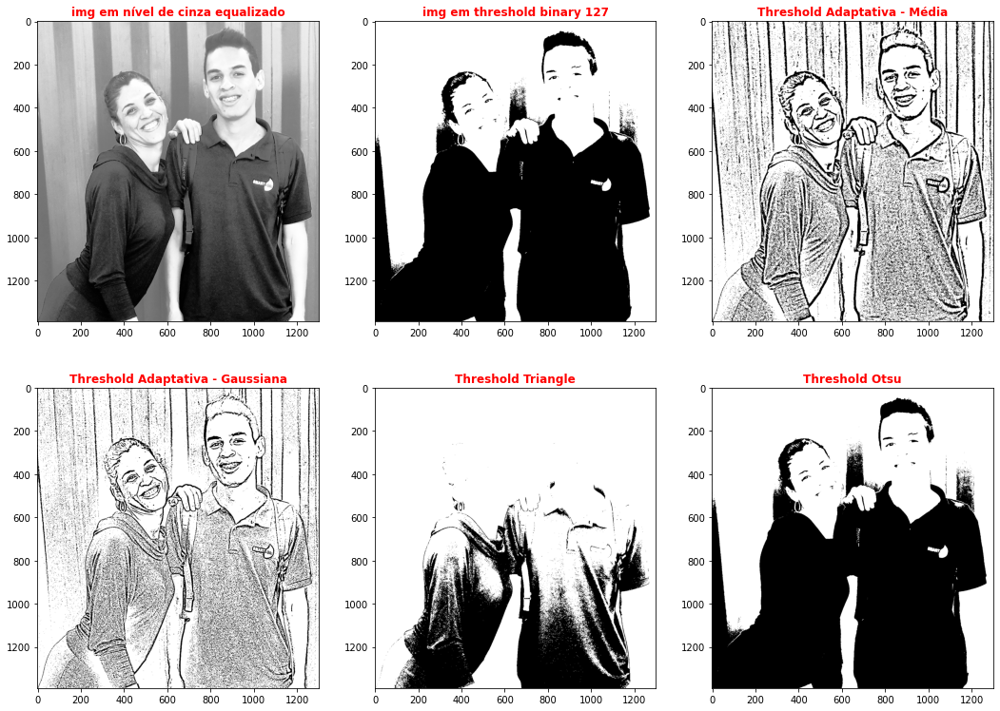

In [15]:
# converte a imagem em nível de cinza
cinza = cv2.cvtColor(img_recortada, cv2.COLOR_BGR2GRAY)

# realza a equalização da imagem
cinza_eq = cv2.equalizeHist(cinza)

# ret é o valor limiar (threshold) que neste caso será 127
ret, thresh_binary = cv2.threshold(cinza_eq, 127, 255, cv2.THRESH_BINARY)

# adaptative threshold - Média
thresh_adaptative_media = cv2.adaptiveThreshold(
    cinza_eq, 255, 
    cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 
    21, 5
)

# adaptative threshold - Gaussiana
thresh_adaptative_gaussiana = cv2.adaptiveThreshold(
    cinza_eq, 255, 
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 
    21, 5
)

# triangle threshold
ret3, thresh_triangle = cv2.threshold(cinza_eq, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)

# Otsu threshold
ret4, thresh_otsu = cv2.threshold (cinza_eq, 0,255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# show_img(img_recortada, "img_recortada")

img_data = {
    "img em nível de cinza equalizado": cinza_eq,
    "img em threshold binary 127": thresh_binary,
    "Threshold Adaptativa - Média": thresh_adaptative_media,
    "Threshold Adaptativa - Gaussiana": thresh_adaptative_gaussiana,
    "Threshold Triangle": thresh_triangle,
    "Threshold Otsu": thresh_otsu,
}
show_img_grid(img_data, ncols=3)


## Suavização de imagens com ruído

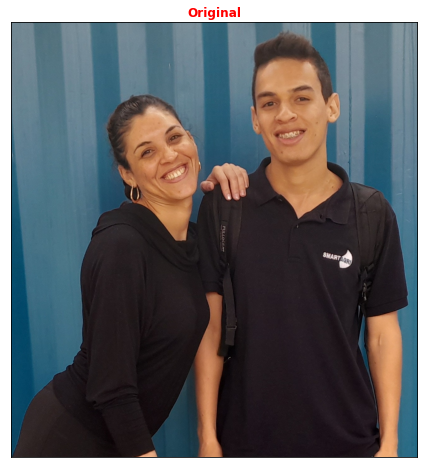

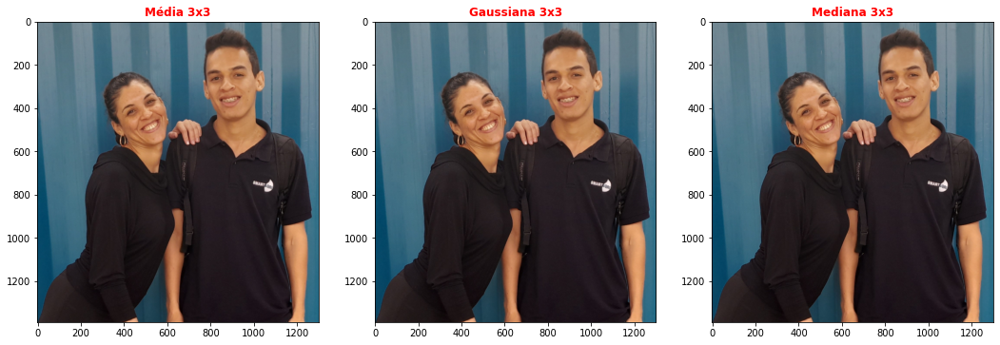

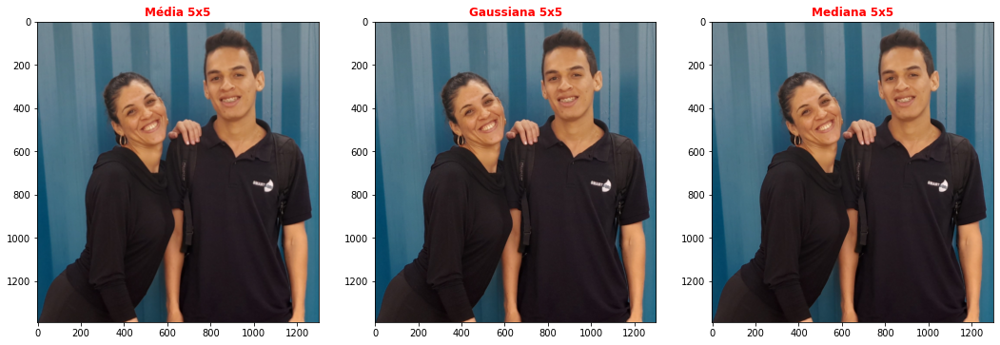

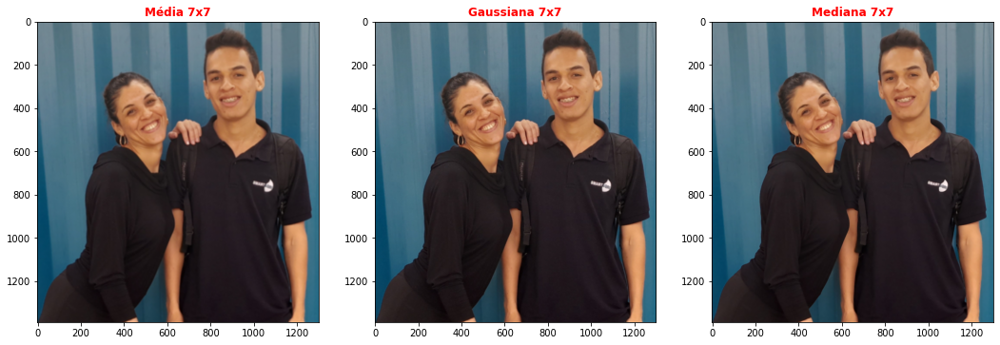

In [16]:
show_img(img_recortada, "Original")

# for n in range(3, 50, 2):
for n in range(3, 8, 2):
    img_data = {
        f"Média {n}x{n}": cv2.blur(img_recortada, (n, n)),
        f"Gaussiana {n}x{n}": cv2.GaussianBlur(img_recortada, (n, n), 0),
        f"Mediana {n}x{n}": cv2.medianBlur(img_recortada, n),
    }
    show_img_grid(img_data)

## Suavização de imagens pelo filtro bilateral

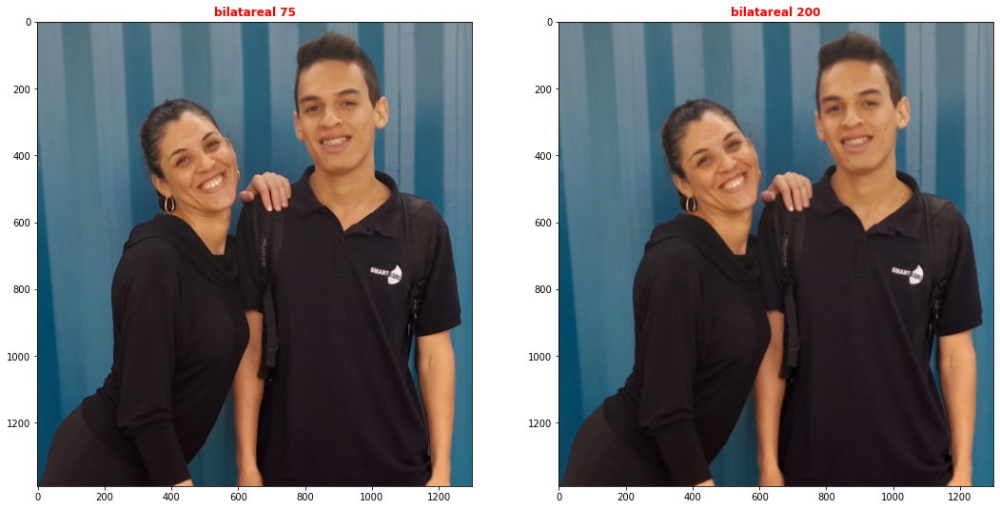

In [17]:
img_data = {
    "bilatareal 75": cv2.bilateralFilter(img_recortada, 9, 75, 75),
    "bilatareal 200": cv2.bilateralFilter(img_recortada, 9, 200, 200),
}
show_img_grid(img_data, ncols=2)